# Table of Contents
* [Instructions](#Instructions)
* [Python Import](#Python-Import)
* [Homogeneous Cylinder (radius r1)](#Homogeneous-Cylinder-%28radius-r1%29)
	* [Create Correction Algorithm](#Create-Correction-Algorithm)
	* [Testing Correction Algorithm](#Testing-Correction-Algorithm)
		* [Create Fake Cylindrical Data Set](#Create-Fake-Cylindrical-Data-Set)
		* [Get Projected Image Over x-axis](#Get-Projected-Image-Over-x-axis)
		* [Apply Correction to Recover Homogeneous Profile](#Apply-Correction-to-Recover-Homogeneous-Profile)
* [Inhomogeneous Cylinder (radius r1 inside Cylinder of radius r2)](#Inhomogeneous-Cylinder-%28radius-r1-inside-Cylinder-of-radius-r2%29)
	* [Create Correction Algorithm](#Create-Correction-Algorithm)
	* [Testing Correction Algorithm](#Testing-Correction-Algorithm)
		* [Create Fake Cylindrical Data Set](#Create-Fake-Cylindrical-Data-Set)
		* [Get Projected Image Over x-axis](#Get-Projected-Image-Over-x-axis)
		* [Apply Correction to Recover from Inhomogeneous Profile](#Apply-Correction-to-Recover-from-Inhomogeneous-Profile)


# Instructions 

In this notebook, I will study how to figure out the relation between the distance d (horizontal distance from the center) and the relative projection (perpendicular to the image)

# Python Import 

In [5]:
from plotly.offline import plot, init_notebook_mode, iplot
import plotly.express as px
import plotly.graph_objects as go


import numpy as np

from IPython.display import Image
from IPython.core.display import HTML

import matplotlib.pyplot as plt
%matplotlib notebook

# Homogeneous Cylinder (radius r1) 

## Create Correction Algorithm 

In [6]:
Image(url="images/homogeneous_cylinder.png", width=300, height=300, unconfined=True)

## Correction Algorithm 

### Create Fake Cylindrical Data Set

<IPython.core.display.Javascript object>


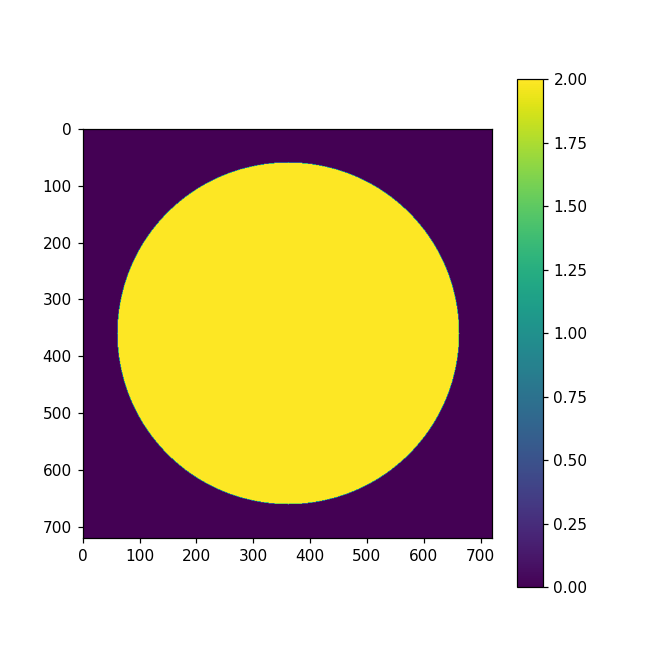

In [8]:
intensity = 2
r=300
width=height=2*r

def is_point_inside_circle(x,y):
    _r = x*x + y*y
    if np.sqrt(_r) <= r:
        return True
    return False

border = int(r/5)
x_range = np.arange(-r-border,r+border)
y_range = np.arange(-r-border,r+border)

circle_matrix_bool = np.empty([len(y_range), len(x_range)], dtype=bool)
for x in x_range:
    for y in y_range:
        _result = is_point_inside_circle(x, y)
        circle_matrix_bool[x+r+border, y+r+border] = _result
        
circle_matrix = np.zeros([len(y_range), len(x_range)])
circle_matrix[circle_matrix_bool] = intensity

fig =  plt.figure(figsize=(6,6))
ax_img = plt.subplot(111)
im = ax_img.imshow(circle_matrix)
fig.colorbar(im)

### Get Projected Image Over x-axis 

In [10]:
projected_image = np.sum(circle_matrix, axis=0)

trace = go.Scatter(y=projected_image)
layout = go.Layout(title="Projected Image",
                  xaxis=dict(title="Counts"),
                  yaxis=dict(title="x"))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

In [11]:
# find center, radius and truncate array

center = int(len(x_range)/2)
radius = r

projected_image_only = projected_image[center - radius:center + radius + 1]

trace = go.Scatter(y=projected_image_only)
layout = go.Layout(
    title="Projected Image Only",
    xaxis=dict(title="Counts"),
    yaxis=dict(title="x"))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

### Apply Correction to Recover Homogeneous Profile

In [12]:
def number_of_pixels_at_that_position1(position=0, radius=1):  
    new_position = np.abs(radius - position)
    half_number_of_pixels = radius*np.sin(np.arccos(new_position/radius))
    if new_position == radius:
        return 1

    number_of_pixels = half_number_of_pixels * 2
    return number_of_pixels

In [13]:
d = np.arange(0, 2*r)
intensity = projected_image_only

expected_array = []
for _index, x in enumerate(d):
    measure = projected_image_only[_index]
    number_of_pixels_through_thickness = number_of_pixels_at_that_position1(position=x, radius=radius)
    expected_array.append(measure / number_of_pixels_through_thickness)

expected_array[0] = np.NaN
trace = go.Scatter(y=expected_array)
layout = go.Layout(title="Expected Array",
                  xaxis=dict(title=""),
                  yaxis=dict(title=""))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

trace = go.Scatter(y=expected_array)
layout = go.Layout(title="Expected Array",
                  xaxis=dict(title=""),
                  yaxis=dict(title="",
                            range=[0,2.5]))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

# Hollow Cylinder (inner radius r1, outer radius r2)

Two cases are then possible:
 - sample is in the ring
 - sample is in the inside cylinder


In [25]:
Image(url="images/inhomogeneous_cylinder.png", width=450, height=450, unconfined=True)

## Sample is in the ring 

Algorithm
```
    if np.abs(_d)>=r2:
        rp_array.append(0)
    elif (np.abs(_d)>=r1) and (np.abs(_d)<=r2):
        rp2 = 2*r2*np.sin(np.arccos(_d/r2))
        rp_array.append(rp2)
    else:
        rp1 = 2*r1*np.sin(np.arccos(_d/r1))
        rp2 = 2*r2*np.sin(np.arccos(_d/r2))
        rp = rp2 - rp1      
        rp_array.append(rp)
```

## Create Correction Algorithm

In [78]:
def number_of_pixel_at_that_position_3(position=-1, inner_circle_r=1, outer_circle_r=1):
    r = np.abs(position)
    if r >= outer_circle_r:
        return 0
    elif (r >= inner_circle_r) and (r <= outer_circle_r):
        return 2*outer_circle_r*np.sin(np.arccos(position/outer_circle_r))
    else:
        rp1 = 2*inner_circle_r*np.sin(np.arccos(position/inner_circle_r))
        rp2 = 2*outer_circle_r*np.sin(np.arccos(position/outer_circle_r))
        rp = rp2 - rp1
        return rp

In [79]:
r1 = 300
r2 = 450
d = np.arange(-r2, r2, 0.01)

rp_array=[]
for _d in d:
    _value = number_of_pixel_at_that_position_3(position=_d, inner_circle_r=r1, outer_circle_r=r2)
    rp_array.append(_value)

trace = go.Scatter(x=d,
                  y=rp_array)
layout = go.Layout(title="r_projected vs d",
                  xaxis=dict(title="d"),
                  yaxis=dict(title="r_projected"))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

In [80]:
coeff = 2*(r2-r1)
factor = []
for _d in d:
    _result = number_of_pixel_at_that_position_3(position=_d, inner_circle_r=r1, outer_circle_r=r2)
    if _result == 0:
        _result = np.NaN
    _result = coeff / _result
    factor.append(_result)
    
trace = go.Scatter(x=d,
                y=factor)
layout = go.Layout(title="Coeff. Factor",
                  xaxis=dict(title="d"),
                  yaxis=dict(title="factor"))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

## Testing Correction Algorithm 

### Create Fake Cylindrical Data Set

<IPython.core.display.Javascript object>


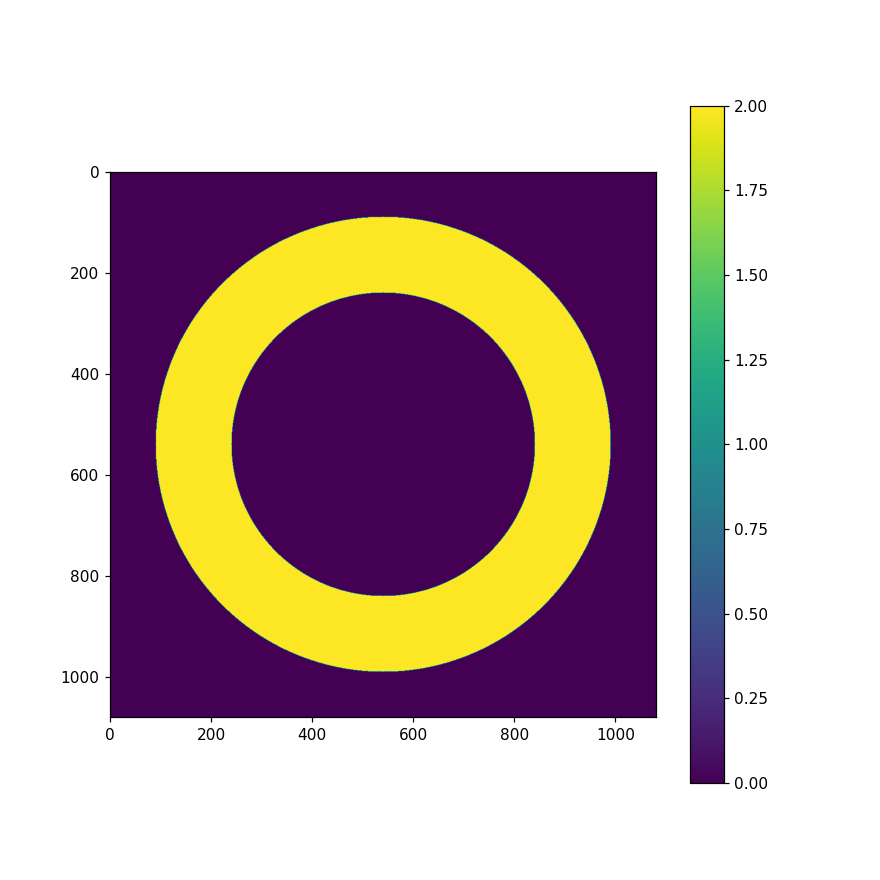

In [30]:
intensity = 2
width=height=2*r2

def is_point_inside_circle(x,y,r):
    _r = x*x + y*y
    if np.sqrt(_r) <= r:
        return True
    return False

def is_point_outside_circle(x,y,r):
    _r = x*x + y*y
    if np.sqrt(_r) > r:
        return True
    return False

border = int(r2/5)
x_range = np.arange(-r2-border,r2+border)
y_range = np.arange(-r2-border,r2+border)

circle_matrix_bool = np.empty([len(y_range), len(x_range)], dtype=bool)
for x in x_range:
    for y in y_range:
        _result = is_point_inside_circle(x, y, r2)
        if _result:
            _result = is_point_outside_circle(x, y, r1)
        circle_matrix_bool[x+r2+border, y+r2+border] = _result
        
circle_matrix = np.zeros([len(y_range), len(x_range)])
circle_matrix[circle_matrix_bool] = intensity

fig =  plt.figure(figsize=(8,8))
ax_img = plt.subplot(111)
im = ax_img.imshow(circle_matrix)
fig.colorbar(im)

### Get Projected Image Over x-axis 

In [31]:
projected_image = np.sum(circle_matrix, axis=0)

trace = go.Scatter(y=projected_image)
layout = go.Layout(title="Projected Image",
                  xaxis=dict(title="Counts"),
                  yaxis=dict(title="x"))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

In [32]:
# find center, radius and truncate array

center = int(len(x_range)/2)
radius = r2

projected_image_only = projected_image[center - radius:center + radius + 1]

trace = go.Scatter(y=projected_image_only)
layout = go.Layout(
    title="Projected Image Only",
    xaxis=dict(title="Counts"),
    yaxis=dict(title="x"))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

### Apply Correction to Recover from Inhomogeneous Profile

In [33]:
def number_of_pixels_at_that_position2(position=0, inner_radius=1, outer_radius=2):  
    new_position = np.abs(outer_radius - position)
    number_of_pixels = inhomogeneous_correction(position=position, 
                                                inner_circle_r=inner_radius, 
                                                outer_circle_r=outer_radius)
    return number_of_pixels

In [34]:
nbr_pixels = []
for x in np.arange(0, r2*2):
    nbr_pixels.append(number_of_pixels_at_that_position2(position=x, 
                                                         inner_radius=r1,
                                                         outer_radius=r2))

trace = go.Scatter(y=nbr_pixels)
layout = go.Layout(title="number of pixels at that position",
                  xaxis=dict(title=""),
                  yaxis=dict(title=""))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

In [37]:
d = np.arange(-r2, r2)
intensity = projected_image_only[int(len(projected_image_only)/2)]/(2*(r2-r1))

expected_array = []
for _index, x in enumerate(d):
    measure = projected_image_only[_index]
    number_of_pixels_through_thickness = number_of_pixels_at_that_position2(position=x,
                                                                           inner_radius=r1,
                                                                           outer_radius=r2)
    if number_of_pixels_through_thickness == 0:
        expected_array.append(np.NaN)
    else:
        expected_array.append(measure / number_of_pixels_through_thickness)
    
    
trace = go.Scatter(y=expected_array)
layout = go.Layout(title="Expected Array",
                  xaxis=dict(title=""),
                  yaxis=dict(title=""))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)


## Sample is in the center and we have thick walls 

In [38]:
Image(url="images/inhomogeneous_cylinder.png", width=450, height=450, unconfined=True)

Algorithm
```
    if (np.abs(_d)>=r1):
        rp_array.append(0)
    else:
        rp1 = 2*r1*np.sin(np.arccos(_d/r1))
        rp2 = 2*r2*np.sin(np.arccos(_d/r2))
        rp = rp2 - rp1      
        rp_array.append(rp)
```

1. we need to evaluate the intensity of the walls (using same formula as sample in the ring)
2. we use that value to find the number of pixels of ring * that intensity to remove from inner circle

### Create Fake Cylindrical Data Set

<IPython.core.display.Javascript object>


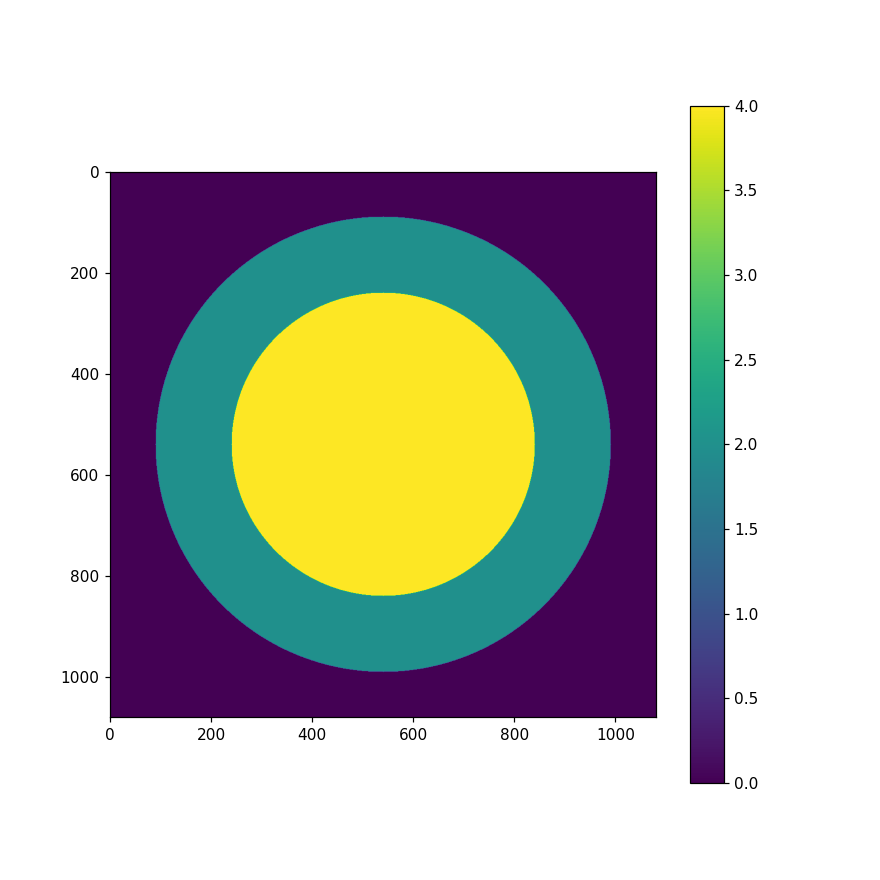

In [41]:
intensity_ring = 2
intensity_inside = 4
width=height=2*r2

def is_point_inside_circle(x,y,r):
    _r = x*x + y*y
    if np.sqrt(_r) <= r:
        return True
    return False

def is_point_outside_circle(x,y,r):
    _r = x*x + y*y
    if np.sqrt(_r) > r:
        return True
    return False

border = int(r2/5)
x_range = np.arange(-r2-border,r2+border)
y_range = np.arange(-r2-border,r2+border)

circle_matrix_bool = np.empty([len(y_range), len(x_range)], dtype=bool)
inside_circle_bool = np.empty([len(y_range), len(x_range)], dtype=bool)
for x in x_range:
    for y in y_range:
        _result = is_point_inside_circle(x, y, r2)
        if _result:
            _result = is_point_outside_circle(x, y, r1)
        inside_circle_bool[x+r2+border, y+r2+border] = is_point_inside_circle(x, y, r1)
        circle_matrix_bool[x+r2+border, y+r2+border] = _result
        
circle_matrix = np.zeros([len(y_range), len(x_range)]) 
circle_matrix[circle_matrix_bool] = intensity_ring
circle_matrix[inside_circle_bool] = intensity_inside

fig =  plt.figure(figsize=(8,8))
ax_img = plt.subplot(111)
im = ax_img.imshow(circle_matrix)
fig.colorbar(im)

In [42]:
projected_image = np.sum(circle_matrix, axis=0)

trace = go.Scatter(y=projected_image)
layout = go.Layout(title="Projected Image",
                  xaxis=dict(title="Counts"),
                  yaxis=dict(title="x"))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

In [44]:
# find center, radius and truncate array

center = int(len(x_range)/2)
radius = r2

projected_image_only = projected_image[center - radius:center + radius]

trace = go.Scatter(y=projected_image_only)
layout = go.Layout(
    title="Projected Image Only",
    xaxis=dict(title="Counts"),
    yaxis=dict(title="x"))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

step1 - we need to evaluate the intensity of the walls (using same formula as sample in the ring)

In [45]:
d = np.arange(0, 2*r2)
intensity = projected_image_only

x = 100
measure = projected_image_only[100]
number_of_pixels_through_thickness = number_of_pixels_at_that_position1(position=x, radius=radius)
intensity_of_ring = measure / number_of_pixels_through_thickness

print(f"intensity of ring is: {intensity_of_ring}")

intensity of ring is: 1.997576656851997


In [46]:
shape_of_ring_signal = []
for x in np.arange(0, r2):
    nbr_pixels = number_of_pixels_at_that_position2(position=x, 
                                                    inner_radius=r1,
                                                    outer_radius=r2)

    shape_of_ring_signal.append(nbr_pixels * intensity_of_ring)
    
full_shape_of_ring_signal = np.concatenate((shape_of_ring_signal[::-1], shape_of_ring_signal))

trace = go.Scatter(y=full_shape_of_ring_signal)
layout = go.Layout(title="Shape of ring",
                  xaxis=dict(title=""),
                  yaxis=dict(title=""))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

In [47]:
removed_ring_counts = projected_image_only - full_shape_of_ring_signal

trace = go.Scatter(y=removed_ring_counts)
layout = go.Layout(title="shape of inner circle only",
                  xaxis=dict(title=""),
                  yaxis=dict(title=""))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

In [49]:
# find center, radius and truncate array

center = int(len(removed_ring_counts)/2)
radius = r1

projected_image_only = removed_ring_counts[center - r1-1: center + r1+1]

trace = go.Scatter(y=projected_image_only)
layout = go.Layout(
    title="Projected Image Only",
    xaxis=dict(title="Counts"),
    yaxis=dict(title="x"))




figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

In [50]:
def number_of_pixels_at_that_position1(position=0, radius=1):  
    new_position = np.abs(radius - position)
    half_number_of_pixels = radius*np.sin(np.arccos(new_position/radius))
    if new_position == radius:
        return 1

    number_of_pixels = half_number_of_pixels * 2
    return number_of_pixels

In [51]:
d = np.arange(0, 2*r1)
intensity = projected_image_only

expected_array = []
for _index, x in enumerate(d):
    measure = projected_image_only[_index]
    number_of_pixels_through_thickness = number_of_pixels_at_that_position1(position=x, radius=r1)
    expected_array.append(measure / number_of_pixels_through_thickness)

trace = go.Scatter(y=expected_array, mode='markers')
layout = go.Layout(title="Expected Array",
                  xaxis=dict(title=""),
                  yaxis=dict(title="",
                            range=[0,5]))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

## Sample is in the center but doesn't have a particular shape and we have thick walls 

## create faking data set

<IPython.core.display.Javascript object>


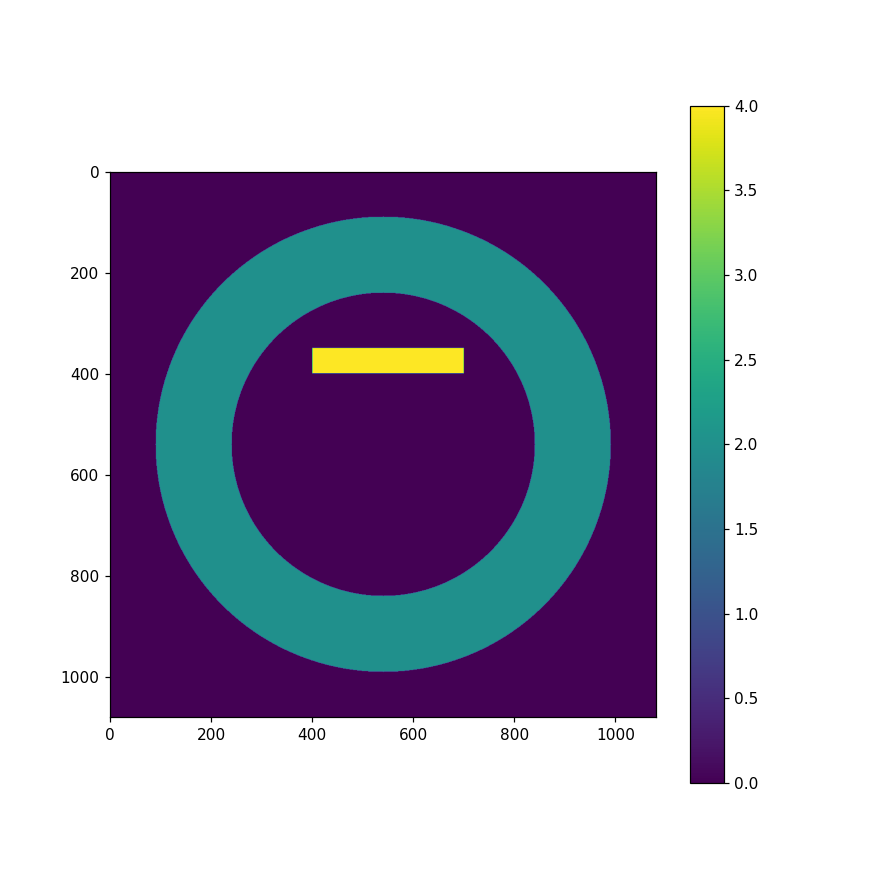

In [54]:
intensity_ring = 2
intensity_sample = 4
width=height=2*r2

# sample (rectangle)
x0 = 400
x1 = 700
y0 = 350
y1 = 400

def is_point_inside_circle(x,y,r):
    _r = x*x + y*y
    if np.sqrt(_r) <= r:
        return True
    return False

def is_point_outside_circle(x,y,r):
    _r = x*x + y*y
    if np.sqrt(_r) > r:
        return True
    return False

border = int(r2/5)
x_range = np.arange(-r2-border,r2+border)
y_range = np.arange(-r2-border,r2+border)

circle_matrix_bool = np.empty([len(y_range), len(x_range)], dtype=bool)
for x in x_range:
    for y in y_range:
        _result = is_point_inside_circle(x, y, r2)
        if _result:
            _result = is_point_outside_circle(x, y, r1)
        circle_matrix_bool[x+r2+border, y+r2+border] = _result
        
circle_matrix = np.zeros([len(y_range), len(x_range)])
circle_matrix[circle_matrix_bool] = intensity_ring

circle_matrix[y0:y1, x0:x1] = intensity_sample

fig =  plt.figure(figsize=(8, 8))
ax_img = plt.subplot(111)
im = ax_img.imshow(circle_matrix)
fig.colorbar(im)

### projected over x-axis 

In [55]:
projected_image = np.sum(circle_matrix, axis=0)

trace = go.Scatter(y=projected_image)
layout = go.Layout(title="Projected Image",
                  xaxis=dict(title="Counts"),
                  yaxis=dict(title="x"))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

In [56]:
# find center, radius and truncate array

center = int(len(x_range)/2)
radius = r2

projected_image_only = projected_image[center - radius:center + radius]

trace = go.Scatter(y=projected_image_only)
layout = go.Layout(
    title="Projected Image Only",
    xaxis=dict(title="Counts"),
    yaxis=dict(title="x"))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

In [57]:
d = np.arange(0, 2*r2)
intensity = projected_image_only

x = 100
measure = projected_image_only[100]
number_of_pixels_through_thickness = number_of_pixels_at_that_position1(position=x, radius=radius)
intensity_of_ring = measure / number_of_pixels_through_thickness

print(f"intensity of ring is: {intensity_of_ring}")

intensity of ring is: 1.997576656851997


In [58]:
shape_of_ring_signal = []
for x in np.arange(0, r2):
    nbr_pixels = number_of_pixels_at_that_position2(position=x, 
                                                    inner_radius=r1,
                                                    outer_radius=r2)

    shape_of_ring_signal.append(nbr_pixels * intensity_of_ring)
    
full_shape_of_ring_signal = np.concatenate((shape_of_ring_signal[::-1], shape_of_ring_signal))

trace = go.Scatter(y=full_shape_of_ring_signal)
layout = go.Layout(title="Shape of ring",
                  xaxis=dict(title=""),
                  yaxis=dict(title=""))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)

In [59]:
removed_ring_counts = projected_image_only - full_shape_of_ring_signal

trace = go.Scatter(y=removed_ring_counts)
layout = go.Layout(title="shape of inner circle only",
                  xaxis=dict(title=""),
                  yaxis=dict(title=""))

figure = go.Figure(data=[trace], layout=layout)
iplot(figure)